In [1]:
import os
import logging
import json
import numpy as np
import pandas as pd
from pandarallel import pandarallel

from gensim.models import LdaModel
from gensim.models.ldamulticore import LdaMulticore
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics import (adjusted_mutual_info_score, 
                           v_measure_score,
                           adjusted_rand_score,
                           fowlkes_mallows_score)

from tqdm import tqdm
from typing import Dict, Tuple, Optional
from datetime import datetime

import seaborn as sns
import matplotlib.pyplot as plt

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import nltk
nltk.download('punkt')

class TopicLabelConsistencyAnalyzer:
    def __init__(self, 
                 data_dir: str,
                 num_topics: int = 40,
                 passes: int = 1,
                 iterations: int = 50,
                 random_state: int = 42):
        """
        初始化主题标签一致性分析器
        """
        self.data_dir = data_dir
        self.num_topics = num_topics
        self.passes = passes
        self.iterations = iterations
        self.random_state = random_state
        
        # 数据存储
        self.abstracts = {}
        self.label_sets = {}
        self.df = None
        
        # 模型和词典
        self.dictionary = None
        self.lda_model = None
        
        # 结果存储
        self.topic_distributions = None
        self.topic_words = None
        self.consistency_metrics = {}
        
        # 标签方法映射
        self.label_to_method = {
            'kmeans_label': 'Periodical2Vec+$k$-means',
            'skm_label': 'Periodical2Vec+Sperical $k$-means',
            'movmf_label': 'Periodical2Vec+movMF',
            'bert_kmeans_label': 'BERT+$k$-means',
            'n2v_kmeans_label': 'Node2Vec+$k$-means',
            'cm_kmeans_label': 'Citation Matrix+$k$-means',
            'gnn_kmeans_label': 'GNN+$k$-means',
            'scopus_label': 'Scopus'
        }

        # 添加停用词相关
        nltk.download('stopwords')  # 下载停用词
        self.stop_words = set(stopwords.words('english'))
        
        # 设置日志
        logging.basicConfig(
            format='%(asctime)s : %(levelname)s : %(message)s',
            level=logging.INFO
        )

        pandarallel.initialize()

    def prepare_dataset(self, only_label=True, save_dir: Optional[str] = None, chunksize: int = 1e5) -> pd.DataFrame:
        """
        准备数据集
        """
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            file_suffix = 'with_tokens' if not only_label else 'only_labels'
            dataset_path = os.path.join(save_dir, f'processed_dataset_{file_suffix}.parquet')
            
            # 检查文件是否存在
            if os.path.exists(dataset_path):
                logging.info(f"找到已处理的数据集文件，正在加载: {dataset_path}")
                try:
                    self.df = pd.read_parquet(dataset_path)
                    logging.info("数据集加载成功")
                    return self.df
                except Exception as e:
                    logging.warning(f"加载数据集失败: {str(e)}")
                    logging.warning("将重新处理数据集")
        
        logging.info('Preparing dataset...')
        abstracts_path = os.path.join(self.data_dir, 
                                    '2010s/classification_tasks/abstracts/paper_abstracts.json')

        logging.info("Processing abstracts...")
        
        # Use pandas to read the JSON file in chunks
        dfs = []
        logging.info("Chunksize: %d", chunksize)
        for chunk in tqdm(pd.read_json(abstracts_path, lines=True, chunksize=chunksize),
                          desc="Processing abstracts", unit="chunk"):
            
            chunk = chunk.rename(columns={'PaperID': 'PaperID'})

            if not only_label:
                chunk['abstract_lower'] = chunk['abstract'].str.lower()
                chunk['tokens'] = chunk['abstract_lower'].parallel_apply(lambda abstract: [
                    token for token in word_tokenize(abstract)
                    if (len(token) > 2 and 
                        token not in self.stop_words and
                        token.isalnum())
                ])
                chunk = chunk.drop(columns=['abstract_lower', 'abstract'], errors='ignore')

            dfs.append(chunk)

        # Concatenate all chunks into a single DataFrame
        self.df = pd.concat(dfs, ignore_index=True)
        logging.info(f"Created DataFrame with {len(self.df)} rows")
        
        # 步骤3: 加载标签
        labels_dir = os.path.join(self.data_dir, '2010s/classification_tasks/labels')
        logging.info("Loading label sets efficiently...")
        
        # 预加载所有标签文件名，只处理JSON文件
        label_files = [f for f in os.listdir(labels_dir) if f.endswith('.json')]
        
        for label_file in label_files:
            label_name = label_file.replace('.json', '')
            logging.info(f"Loading {label_name}...")
            
            with open(os.path.join(labels_dir, label_file), 'r') as f:
                label_set = json.load(f)
            
            self.df[label_name] = self.df['PaperID'].map(label_set)
        
        # 保存处理后的数据集
        if save_dir:
            try:
                self.df.to_parquet(dataset_path)
                logging.info(f"数据集已保存到: {dataset_path}")
            except Exception as e:
                logging.warning(f"保存数据集失败: {str(e)}")
        
        return self.df
    
    
    def select_optimal_topics(self,
                              topic_numbers: range = range(20, 201, 20),
                              save_dir: Optional[str] = None) -> Dict:
        """
        评估不同主题数量的模型表现，使用优化的参数配置并实时保存结果
        """        
        if self.df is None:
            self.prepare_dataset(only_label=False)
        
        # 确保save_dir存在
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            
        # 优化：提前准备语料库和texts
        logging.info('准备语料库...')
        if self.dictionary is None:
            self.dictionary = Dictionary(self.df['tokens'])
            self.dictionary.filter_extremes(no_below=5, no_above=0.5)
        
        # 将corpus和texts预先准备好
        corpus = [self.dictionary.doc2bow(text) for text in self.df['tokens']]
        texts = self.df['tokens'].tolist()
        
        results = []
        logging.info("开始评估不同主题数量...")
        
        # 创建实时结果文件
        if save_dir:
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            results_file = os.path.join(save_dir, f'topic_number_results_{timestamp}.csv')
            fig_file = os.path.join(save_dir, f'topic_number_evaluation_{timestamp}.png')
            
            # 写入CSV头
            pd.DataFrame(columns=['num_topics', 'coherence']).to_csv(
                results_file, index=False
            )
        
        try:
            for num_topics in tqdm(topic_numbers):
                try:
                    model = LdaModel(
                        corpus=corpus,
                        id2word=self.dictionary,
                        num_topics=num_topics,
                        passes=self.passes,
                        iterations=self.iterations,
                        eval_every=None,        # 禁用评估
                        per_word_topics=False,  # 禁用词主题分布
                        random_state=self.random_state
                    )
                    
                    # 计算一致性
                    coherence_model = CoherenceModel(
                        model=model,
                        texts=texts,
                        dictionary=self.dictionary,
                        coherence='c_v',
                        processes=8  # 减少进程数
                    )
                    coherence = coherence_model.get_coherence()
                    
                    result = {
                        'num_topics': num_topics,
                        'coherence': coherence
                    }
                    results.append(result)
                    
                    # 实时保存结果到CSV
                    if save_dir:
                        pd.DataFrame([result]).to_csv(
                            results_file, 
                            mode='a', 
                            header=False, 
                            index=False
                        )
                        
                        # 更新并保存图表
                        results_df = pd.DataFrame(results)
                        plt.figure(figsize=(10, 5))
                        plt.plot(results_df['num_topics'], 
                                results_df['coherence'], 
                                marker='o')
                        plt.xlabel('Number of Topics')
                        plt.ylabel('Coherence Score')
                        plt.title('Topic Coherence vs Number of Topics')
                        plt.grid(True)
                        plt.savefig(fig_file)
                        plt.close()
                    
                    # 清理内存
                    del model
                    del coherence_model
                    import gc
                    gc.collect()
                    
                except Exception as e:
                    logging.error(f"处理主题数 {num_topics} 时发生错误: {str(e)}")
                    continue
            
            # 完成后的处理
            results_df = pd.DataFrame(results)
            best_coherence_idx = results_df['coherence'].idxmax()
            
            optimal_results = {
                'best_num_topics': results_df.loc[best_coherence_idx, 'num_topics'],
                'best_coherence_score': results_df.loc[best_coherence_idx, 'coherence'],
                'all_results': results_df
            }
            
            logging.info(f"\n最优主题数量评估结果:")
            logging.info(f"最佳主题数量: {optimal_results['best_num_topics']} "
                        f"(coherence = {optimal_results['best_coherence_score']:.4f})")
            
            return optimal_results
            
        except Exception as e:
            logging.error(f"评估过程中发生错误: {str(e)}")
            if results:  # 如果有部分结果，仍然返回
                return {'partial_results': pd.DataFrame(results)}
            raise


    def train_lda_model(self, save_dir: Optional[str] = None) -> None:
        """训练LDA模型或加载已有模型"""
        if self.df is None:
            self.prepare_dataset()
            
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            model_path = os.path.join(save_dir, f'lda_model_{self.num_topics}topics.model')
            dict_path = os.path.join(save_dir, f'lda_model_{self.num_topics}topics.model.id2word')
            
            # 检查模型文件是否存在
            if os.path.exists(model_path) and os.path.exists(dict_path):
                try:
                    logging.info(f"找到已有模型文件，正在加载...")
                    self.lda_model = LdaMulticore.load(model_path)
                    self.dictionary = Dictionary.load(dict_path)
                    logging.info(f"模型加载成功：{model_path}")
                    return
                except Exception as e:
                    logging.warning(f"加载模型失败: {str(e)}")
                    logging.warning("将重新训练模型")
        
        logging.info("开始训练新的LDA模型...")
        
        # 创建词典
        self.dictionary = Dictionary(self.df['tokens'])
        self.dictionary.filter_extremes(no_below=5, no_above=0.5)
        
        # 转换为BOW格式
        corpus = [self.dictionary.doc2bow(text) for text in self.df['tokens']]
        
        # 训练模型
        self.lda_model = LdaMulticore(
            corpus=corpus,
            id2word=self.dictionary,
            num_topics=self.num_topics,
            passes=self.passes,
            iterations=self.iterations,
            random_state=self.random_state,
            workers = 8,
            eval_every=None,        # 禁用评估
            per_word_topics=False,  # 禁用词主题分布
            batch=False,            # 禁用批处理
        )
        
        # 保存模型和词典
        if save_dir:
            self.lda_model.save(model_path)
            self.dictionary.save(dict_path)
            logging.info(f"模型已保存到: {model_path}")
            logging.info(f"词典已保存到: {dict_path}")


    def analyze_vocabulary(self) -> Dict:
        """分析词汇统计信息"""
        if self.dictionary is None:
            raise ValueError("Dictionary not created yet. Run train_lda_model first.")
            
        vocab_stats = {
            'total_words': len(self.dictionary),
            'word_frequencies': sorted(
                [
                    (self.dictionary[id], freq)
                    for id, freq in self.dictionary.cfs.items()
                ],
                key=lambda x: x[1],
                reverse=True
            )[:50]  # 显示top 50词频
        }
        
        logging.info(f"词典大小: {vocab_stats['total_words']}")
        logging.info("Top 50 最常见的词:")
        for word, freq in vocab_stats['word_frequencies']:
            logging.info(f"{word}: {freq}")
            
        return vocab_stats


    def get_topic_distributions(self) -> np.ndarray:
        """获取文档-主题分布"""
        logging.info("Extracting topic distributions...")
        
        doc_topics = np.zeros((len(self.df), self.num_topics))
        corpus = [self.dictionary.doc2bow(text) for text in self.df['tokens']]
        
        for i, bow in enumerate(tqdm(corpus)):
            topic_dist = self.lda_model.get_document_topics(bow, minimum_probability=0)
            for topic_id, prob in topic_dist:
                doc_topics[i, topic_id] = prob
                
        self.topic_distributions = doc_topics
        return doc_topics
    

    def visualize_topic_label_matrix(self,
                                label_type: str,
                                metrics: Dict,
                                save_dir: Optional[str] = None,
                                figsize: Tuple[int, int] = (8, 8),
                                cmap: str = 'YlOrRd',
                                fmt: str = '.2f',
                                cluster: bool = True) -> None:
        """
        可视化主题-标签矩阵，优化大规模主题和标签的显示
        """
        matrix = metrics['topic_label_matrix']
        
        # 使用clustermap并优化布局
        g = sns.clustermap(
            matrix,
            cmap=cmap,
            annot=False,
            fmt=fmt,
            figsize=figsize,
            xticklabels=False,  # 不显示x轴标签
            yticklabels=False,  # 不显示y轴标签
            row_cluster=True,
            col_cluster=True
        )
        
        # 调整标签大小和间距
        g.ax_heatmap.set_xlabel('Labels', fontsize=12)
        g.ax_heatmap.set_ylabel('Topics', fontsize=12)
        
        # 保存完整的聚类图
        if cluster and save_dir:
            filename = os.path.join(
                save_dir,
                f'topic_label_matrix_{label_type}.pdf'
            )
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            logging.info(f"聚类图已保存至: {filename}")


    def analyze_all_label_types(self, label_to_method: dict, save_dir: Optional[str] = None) -> Dict:
        """分析所有标签类型"""
        if self.df is None:
            self.prepare_dataset(only_label=True, save_dir=save_dir)
            
        # 检查模型
        if self.lda_model is None:
            self.train_lda_model(save_dir)
        
        # 检查主题分布文件
        topic_dist_path = None
        if save_dir:
            topic_dist_path = os.path.join(save_dir, 
                                        f'topic_distributions_{self.num_topics}topics.npy')
            if os.path.exists(topic_dist_path):
                try:
                    logging.info(f"找到已有主题分布文件，正在加载...")
                    self.topic_distributions = np.load(topic_dist_path)
                    logging.info(f"主题分布加载成功")
                except Exception as e:
                    logging.warning(f"加载主题分布失败: {str(e)}")
                    logging.warning("将重新计算主题分布")
                    self.topic_distributions = None
        
        # 计算主题分布
        if self.topic_distributions is None:
            logging.info("计算文档主题分布...")
            self.topic_distributions = self.get_topic_distributions()
            # 保存主题分布
            if topic_dist_path:
                np.save(topic_dist_path, self.topic_distributions)
                logging.info(f"主题分布已保存到: {topic_dist_path}")
        
        # 获取主题分配（只计算一次）
        topic_assignments = np.argmax(self.topic_distributions, axis=1)
        
        results = {}
        summary_data = []
        
        # 遍历每种标签类型进行分析
        for label_type in label_to_method.keys():
            logging.info(f"\nAnalyzing {label_type}...")
            
            # 获取标签
            labels = self.df[label_type].values
            
            # 计算各种一致性指标
            nmi = normalized_mutual_info_score(labels, topic_assignments)
            ami = adjusted_mutual_info_score(labels, topic_assignments)
            v_measure = v_measure_score(labels, topic_assignments)
            ari = adjusted_rand_score(labels, topic_assignments)
            fmi = fowlkes_mallows_score(labels, topic_assignments)
            
            # 计算主题-标签对应关系
            unique_labels = sorted(self.df[label_type].unique())
            topic_label_matrix = np.zeros((self.num_topics, len(unique_labels)))
            
            # 使用numpy的高效操作计算主题-标签矩阵
            for doc_idx, (topic_idx, label) in enumerate(zip(topic_assignments, labels)):
                label_idx = unique_labels.index(label)
                topic_label_matrix[topic_idx, label_idx] += 1
            
            # 标准化主题-标签矩阵
            row_sums = topic_label_matrix.sum(axis=1, keepdims=True)
            topic_label_matrix = np.divide(topic_label_matrix, row_sums, 
                                        where=row_sums!=0)
            
            # 存储结果
            metrics = {
                'normalized_mutual_information': nmi,
                'adjusted_mutual_information': ami,
                'v_measure': v_measure,
                'adjusted_rand_index': ari,
                'fowlkes_mallows_index': fmi,
                'topic_label_matrix': topic_label_matrix,
                'unique_labels': unique_labels
            }
            
            results[label_type] = metrics
            
            # 可视化并保存结果
            self.visualize_topic_label_matrix(label_type, metrics, save_dir)
            
            # 收集总结数据
            summary_data.append({
                'Label Type': label_to_method[label_type],
                'NMI': nmi,
                'AMI': ami,
                'V-measure': v_measure,
                'ARI': ari,
                'FMI': fmi
            })
        
        # 创建和保存总结表格
        summary_df = pd.DataFrame(summary_data)
        if save_dir:
            summary_df.to_csv(os.path.join(save_dir, 
                            f'consistency_metrics_summary.csv'),
                            index=False)
        
        return results

/home/lyuzhuoqi/miniconda3/envs/p2v/lib/python3.11/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
[nltk_data] Downloading package punkt to /home/lyuzhuoqi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Neck

In [2]:
import sys
sys.path.append("clustering")

from utils import get_data_dir

In [3]:
# 初始化分析器
analyzer = TopicLabelConsistencyAnalyzer(
    data_dir=get_data_dir(),
    passes=1,
    iterations=50)

data_dir:  /home/lyuzhuoqi/projects/clustering/data
INFO: Pandarallel will run on 10 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/lyuzhuoqi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Prepare data

In [ ]:
# generate or load dataset
analyzer.prepare_dataset(only_label=False, save_dir='/home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency')

2025-03-01 00:22:58,817 : INFO : Preparing dataset...
2025-03-01 00:22:58,817 : INFO : Processing abstracts...
2025-03-01 00:22:58,818 : INFO : Chunksize: 100000
Processing abstracts: 76chunk [24:58, 17.39s/chunk]

: 

: 

: 

: 

# Statistics

In [ ]:
label_counts = analyzer.df['scopus_label'].value_counts()
total = len(analyzer.df)
percentage_df = pd.DataFrame({
    'Count': label_counts,
    'Percentage': (label_counts / total * 100).round(2)
})
percentage_df.to_csv('/home/lyuzhuoqi/projects/clustering/data/2010s/MAG_paper_with_abstract_scopus_label_distribution.csv')
print("Distribution of Scopus labels:")
print(percentage_df.to_string(float_format=lambda x: f"{x:.2f}"))

Distribution of Scopus labels:
                                               Count  Percentage
scopus_label                                                    
Medicine                                      409214       26.79
Physics and Astronomy                         118832        7.78
Chemistry                                     103767        6.79
Agricultural and Biological Sciences          101904        6.67
Engineering                                    99710        6.53
Biochemistry, Genetics and Molecular Biology   91653        6.00
Social Sciences                                90429        5.92
Materials Science                              79545        5.21
Mathematics                                    47212        3.09
Earth and Planetary Sciences                   42435        2.78
Environmental Science                          35111        2.30
Immunology and Microbiology                    32091        2.10
Pharmacology, Toxicology and Pharmaceutics     31778       

# Finding optimal # of topic for LDA

In [5]:
# 评估最优主题数量
optimal_results = analyzer.select_optimal_topics(
    topic_numbers=range(80, 201, 10),
    save_dir='/home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency'
)

2025-02-21 16:11:09,849 : INFO : 准备语料库...
2025-02-21 16:11:09,850 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2025-02-21 16:11:10,283 : INFO : adding document #10000 to Dictionary<75340 unique tokens: ['1416', '471', 'acids', 'amino', 'analysis']...>
2025-02-21 16:11:10,763 : INFO : adding document #20000 to Dictionary<113323 unique tokens: ['1416', '471', 'acids', 'amino', 'analysis']...>
2025-02-21 16:11:11,296 : INFO : adding document #30000 to Dictionary<143663 unique tokens: ['1416', '471', 'acids', 'amino', 'analysis']...>
2025-02-21 16:11:11,875 : INFO : adding document #40000 to Dictionary<170253 unique tokens: ['1416', '471', 'acids', 'amino', 'analysis']...>
2025-02-21 16:11:12,421 : INFO : adding document #50000 to Dictionary<191637 unique tokens: ['1416', '471', 'acids', 'amino', 'analysis']...>
2025-02-21 16:11:12,939 : INFO : adding document #60000 to Dictionary<212687 unique tokens: ['1416', '471', 'acids', 'amino', 'analysis']...>
2025-02-21 16:11:13,

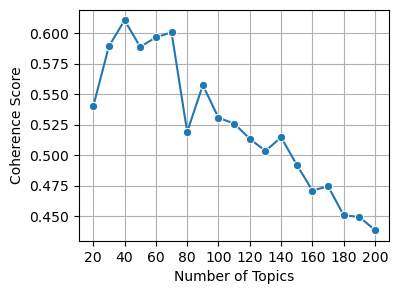

In [30]:
coherence_df_1 = pd.read_csv('/home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/topic_number_results_20250221_131848.csv')
coherence_df_2 = pd.read_csv('/home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/topic_number_results_20250221_161340.csv')
coherence_df = pd.concat([coherence_df_1, coherence_df_2])

plt.figure(figsize=(4, 3))
sns.lineplot(data=coherence_df, x='num_topics', y='coherence', marker='o')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.xticks(range(20, 201, 20))
plt.grid(True)

plt.savefig('/home/lyuzhuoqi/projects/clustering/tasks/coherence_scores.pdf', 
            bbox_inches='tight', dpi=300)

# Training a (or loading a trained) LDA model

In [40]:
# 使用最优主题数量重新初始化分析器
analyzer.num_topics = 40
analyzer.train_lda_model(save_dir='/home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency')

2025-02-27 16:26:19,412 : INFO : 找到已有模型文件，正在加载...
2025-02-27 16:26:19,413 : INFO : loading LdaMulticore object from /home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/lda_model_40topics.model
2025-02-27 16:26:19,415 : INFO : loading expElogbeta from /home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/lda_model_40topics.model.expElogbeta.npy with mmap=None
2025-02-27 16:26:19,423 : INFO : setting ignored attribute state to None
2025-02-27 16:26:19,424 : INFO : setting ignored attribute dispatcher to None
2025-02-27 16:26:19,424 : INFO : setting ignored attribute id2word to None
2025-02-27 16:26:19,425 : INFO : LdaMulticore lifecycle event {'fname': '/home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/lda_model_40topics.model', 'datetime': '2025-02-27T16:26:19.425184', 'gensim': '4.3.3', 'python': '3.11.8 | packaged by conda-forge | (main, Feb 16 2024, 20:53:32) [GCC 12.3.0]', 'platform': 'Linux-5.15.167.4-microsoft-standard-WSL2-x86_64-with-glibc2

In [7]:
analyzer.analyze_vocabulary()

2025-02-23 16:39:52,012 : INFO : 词典大小: 100000
2025-02-23 16:39:52,012 : INFO : Top 50 最常见的词:
2025-02-23 16:39:52,013 : INFO : patients: 622774
2025-02-23 16:39:52,013 : INFO : results: 608078
2025-02-23 16:39:52,013 : INFO : study: 589550
2025-02-23 16:39:52,014 : INFO : using: 489308
2025-02-23 16:39:52,015 : INFO : also: 396383
2025-02-23 16:39:52,015 : INFO : used: 389565
2025-02-23 16:39:52,015 : INFO : two: 366603
2025-02-23 16:39:52,016 : INFO : data: 366350
2025-02-23 16:39:52,016 : INFO : cells: 335924
2025-02-23 16:39:52,016 : INFO : model: 326907
2025-02-23 16:39:52,017 : INFO : analysis: 321210
2025-02-23 16:39:52,017 : INFO : different: 310871
2025-02-23 16:39:52,017 : INFO : may: 297597
2025-02-23 16:39:52,018 : INFO : treatment: 281347
2025-02-23 16:39:52,018 : INFO : high: 273212
2025-02-23 16:39:52,018 : INFO : one: 272715
2025-02-23 16:39:52,019 : INFO : method: 272093
2025-02-23 16:39:52,019 : INFO : system: 265021
2025-02-23 16:39:52,019 : INFO : time: 255378
2025-02

{'total_words': 100000,
 'word_frequencies': [('patients', 622774),
  ('results', 608078),
  ('study', 589550),
  ('using', 489308),
  ('also', 396383),
  ('used', 389565),
  ('two', 366603),
  ('data', 366350),
  ('cells', 335924),
  ('model', 326907),
  ('analysis', 321210),
  ('different', 310871),
  ('may', 297597),
  ('treatment', 281347),
  ('high', 273212),
  ('one', 272715),
  ('method', 272093),
  ('system', 265021),
  ('time', 255378),
  ('cell', 250615),
  ('new', 247656),
  ('found', 245969),
  ('group', 245272),
  ('methods', 241307),
  ('based', 240225),
  ('compared', 235043),
  ('use', 232438),
  ('however', 227941),
  ('studies', 223171),
  ('paper', 220973),
  ('effect', 219030),
  ('effects', 217374),
  ('significant', 214973),
  ('increased', 212143),
  ('showed', 209420),
  ('associated', 207402),
  ('well', 206411),
  ('control', 201312),
  ('higher', 198880),
  ('expression', 196241),
  ('significantly', 194402),
  ('activity', 193887),
  ('present', 193210),
  (

In [8]:
# Print top 20 words for first 5 topics as examples
print("Example Topics from LDA Model:")
for topic_id in range(5):  # Show first 5 topics
    # Get the top 20 words for this topic
    top_words = [word for word, _ in analyzer.lda_model.show_topic(topic_id, topn=20)]
    print(f"\nTopic {topic_id}:")
    # Display 5 words per line
    for i in range(0, len(top_words), 5):
        print(", ".join(top_words[i:i+5]))

Example Topics from LDA Model:

Topic 0:
surgery, group, patients, surgical, procedure
results, performed, technique, asthma, time
postoperative, using, complications, study, mean
procedures, methods, used, repair, rate

Topic 1:
children, females, males, age, male
female, group, groups, study, days
day, alcohol, feeding, young, per
adults, reproductive, body, adult, time

Topic 2:
acid, samples, strains, protein, activity
bacteria, using, acids, strain, bacterial
isolates, coli, enzyme, detection, amino
method, showed, used, study, respectively

Topic 3:
plant, plants, growth, activity, showed
content, extract, yield, leaf, seed
root, leaves, higher, increased, acid
effects, different, effect, study, rice

Topic 4:
des, les, une, dans, par
est, pour, sur, que, plus
avec, qui, ete, ont, sont
chez, cas, pas, ces, cette


# Consistency analysis

2025-02-27 16:26:25,755 : INFO : 找到已有主题分布文件，正在加载...
2025-02-27 16:26:25,967 : INFO : 主题分布加载成功
2025-02-27 16:26:26,028 : INFO : 
Analyzing kmeans_label...
2025-02-27 16:26:29,616 : INFO : 聚类图已保存至: /home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/topic_label_matrix_kmeans_label.pdf
2025-02-27 16:26:29,616 : INFO : 
Analyzing skm_label...
2025-02-27 16:26:33,144 : INFO : 聚类图已保存至: /home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/topic_label_matrix_skm_label.pdf
2025-02-27 16:26:33,144 : INFO : 
Analyzing movmf_label...
2025-02-27 16:26:36,632 : INFO : 聚类图已保存至: /home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/topic_label_matrix_movmf_label.pdf
2025-02-27 16:26:36,633 : INFO : 
Analyzing bert_kmeans_label...
2025-02-27 16:26:39,965 : INFO : 聚类图已保存至: /home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency/topic_label_matrix_bert_kmeans_label.pdf
2025-02-27 16:26:39,966 : INFO : 
Analyzing n2v_kmeans_label...
2025-02-27 16:26:43,474 : IN

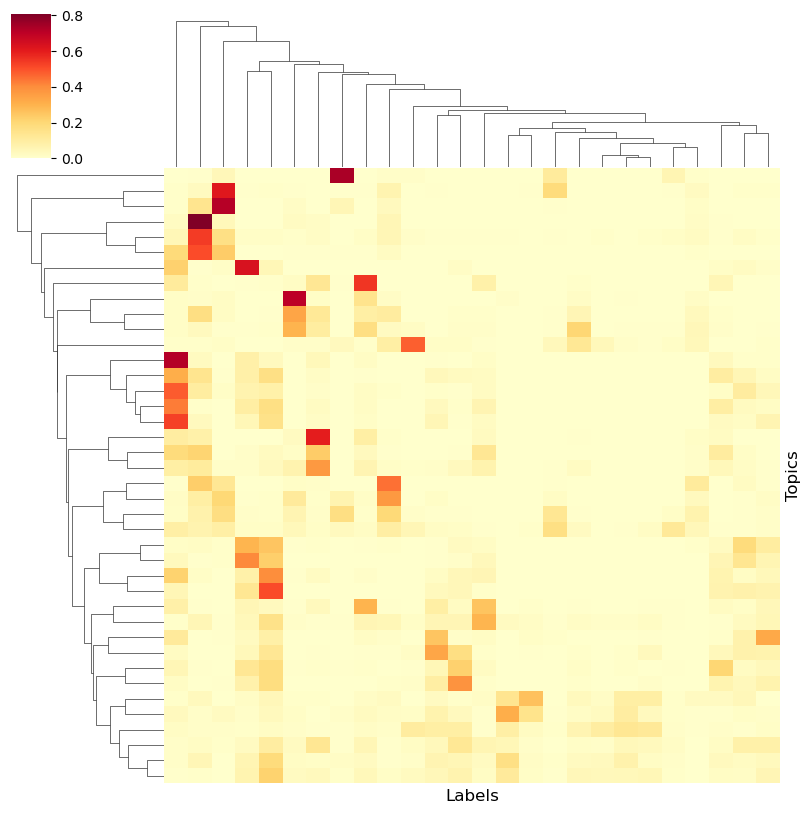

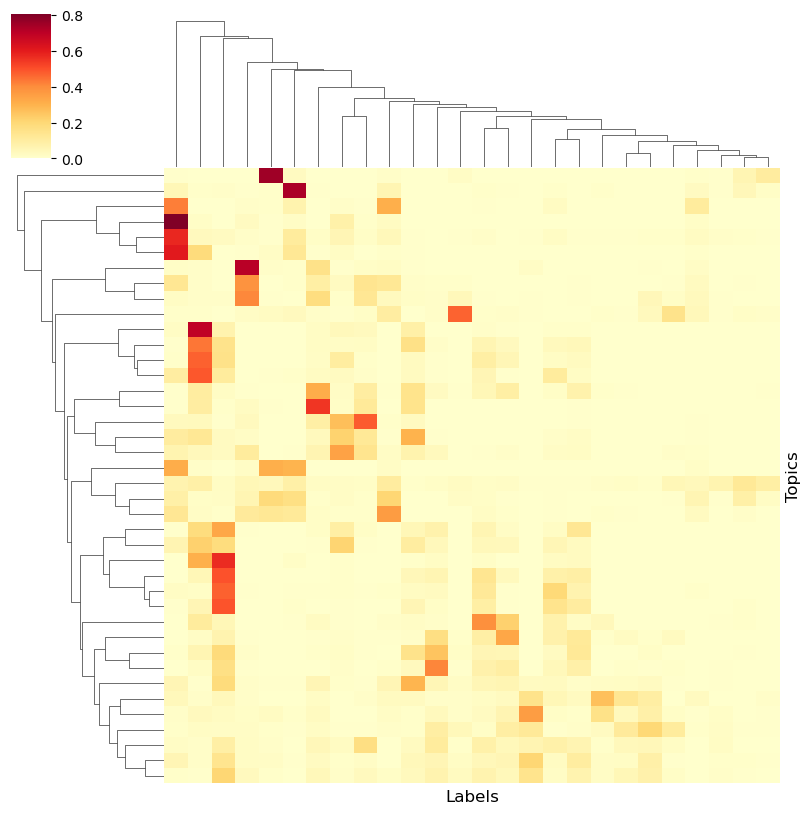

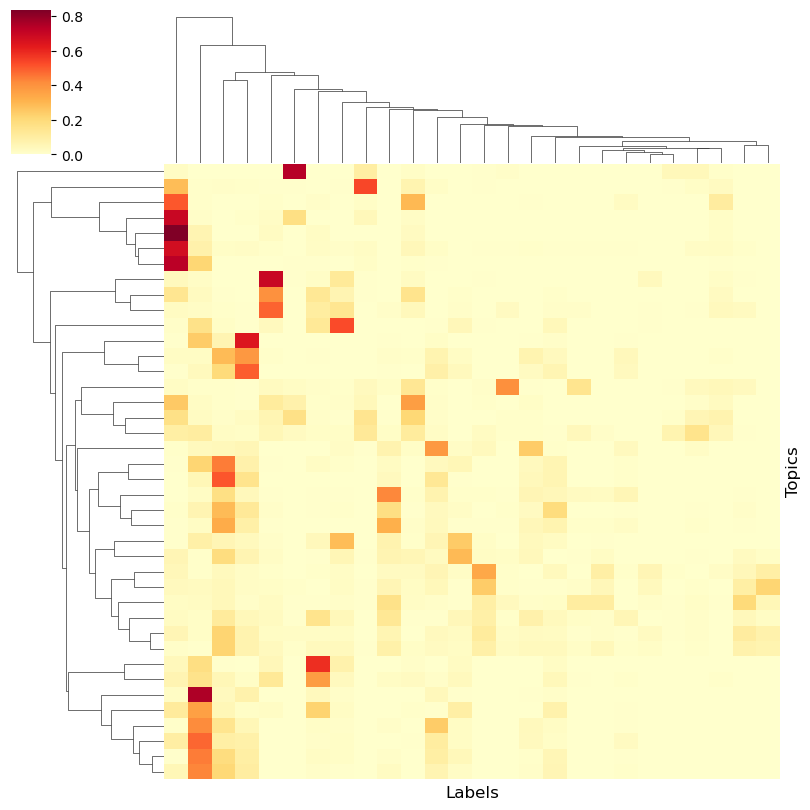

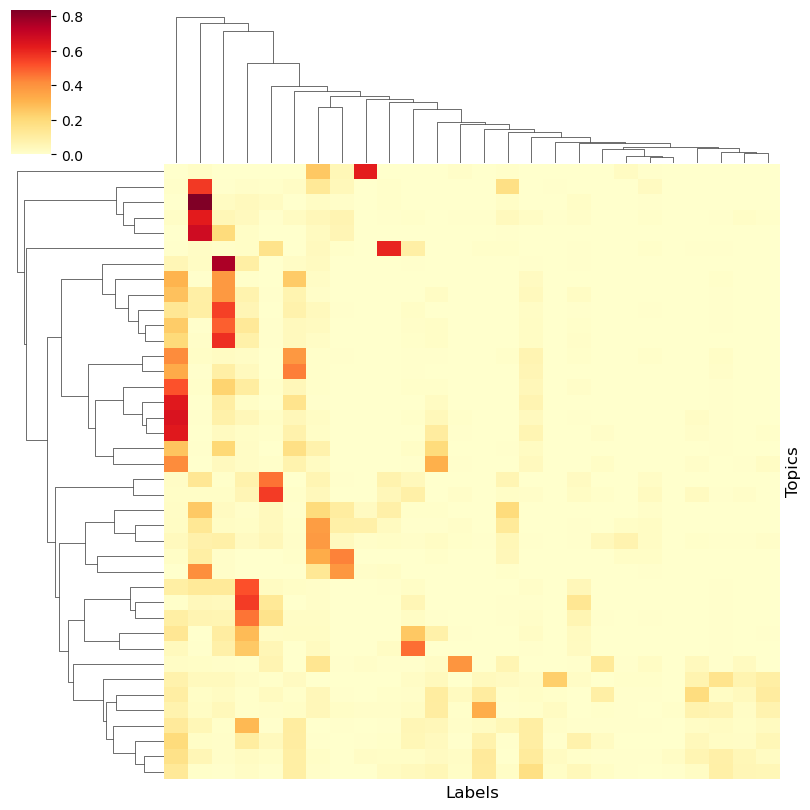

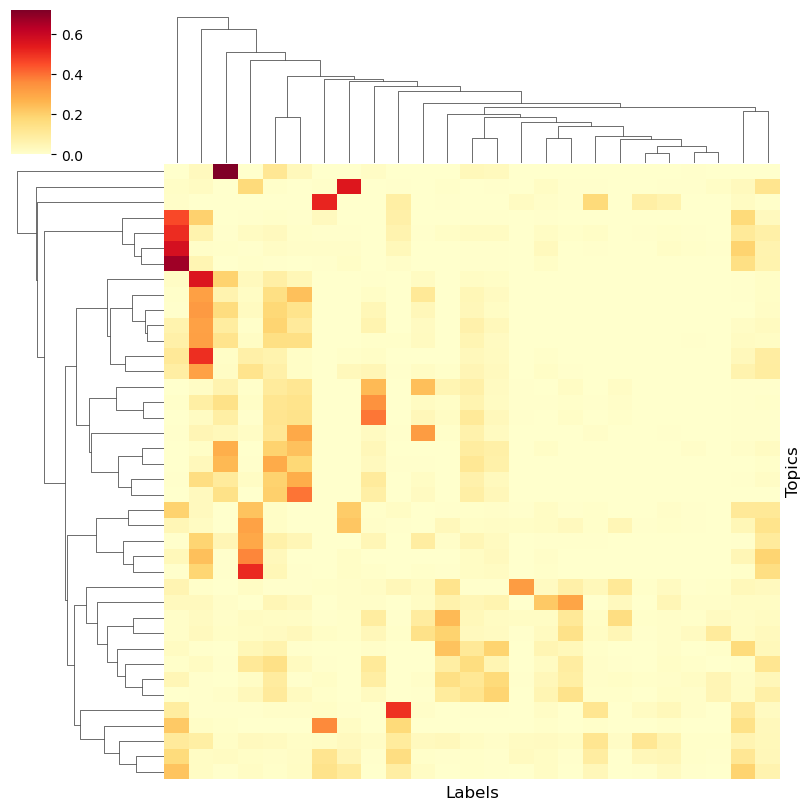

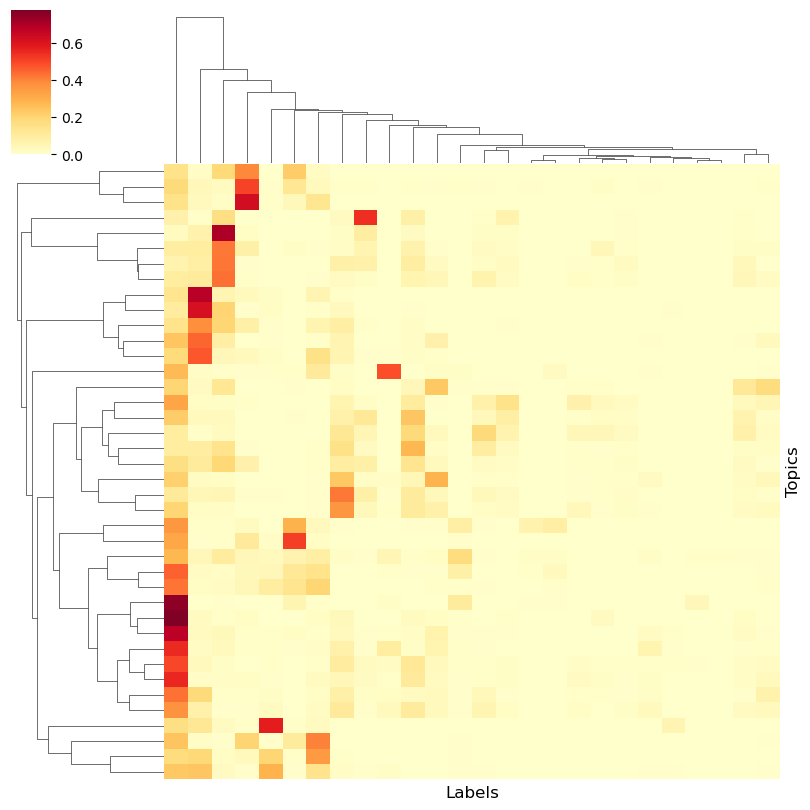

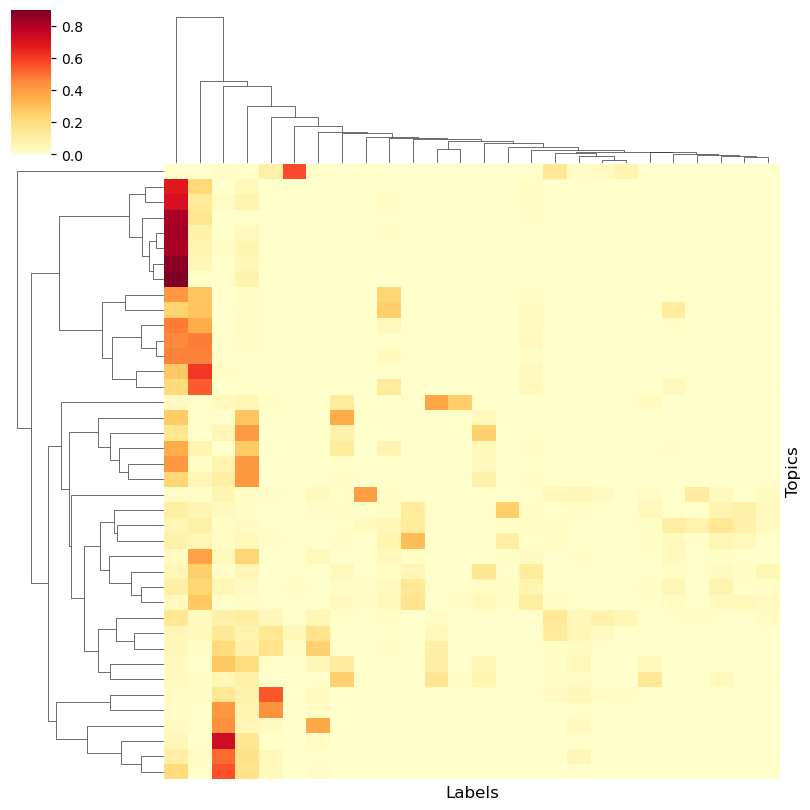

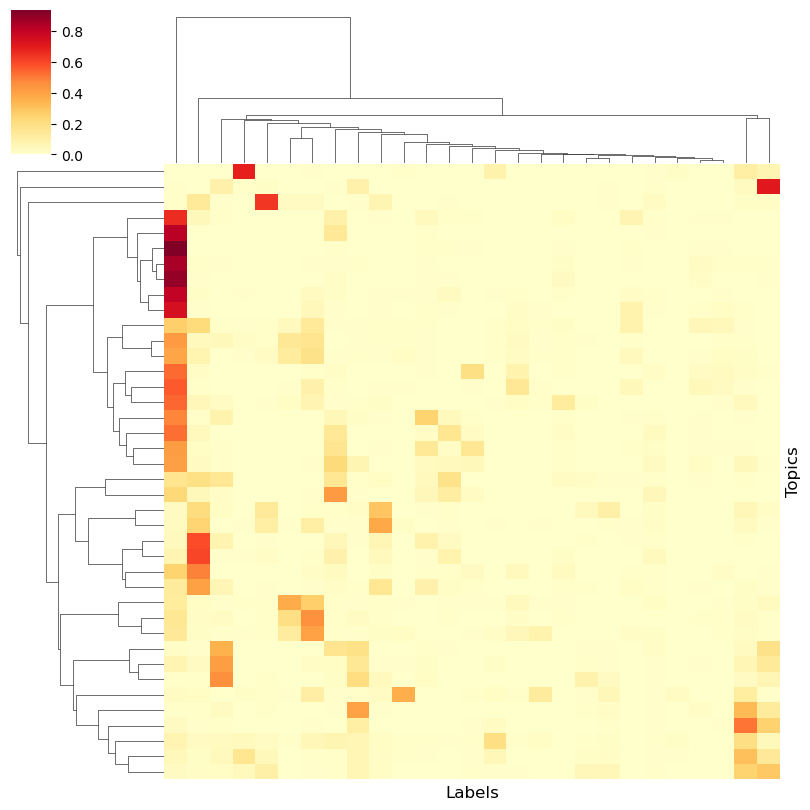

In [41]:
# 分析所有标签类型
label_to_method = {
            'kmeans_label': 'Periodical2Vec+$k$-means',
            'skm_label': 'Periodical2Vec+Sperical $k$-means',
            'movmf_label': 'Periodical2Vec+movMF',
            'bert_kmeans_label': 'BERT+$k$-means',
            'n2v_kmeans_label': 'Node2Vec+$k$-means',
            'cm_kmeans_label': 'Citation Matrix+$k$-means',
            'gnn_kmeans_label': 'GNN+$k$-means',
            'scopus_label': 'Scopus'
        }
results = analyzer.analyze_all_label_types(label_to_method, save_dir='/home/lyuzhuoqi/projects/clustering/data/2010s/topic_consistency')

In [16]:
# 查看特定标签类型的结果
for label_type, metrics in results.items():
    print(f"\n{analyzer.label_to_method[label_type]}的一致性指标:")
    print(f"标准化互信息: {metrics['normalized_mutual_information']:.4f}")
    print(f"调整兰德指数: {metrics['adjusted_rand_index']:.4f}")
    print(f"Fowlkes-Mallows指数: {metrics['fowlkes_mallows_index']:.4f}")
    


Periodical2Vec+$k$-means的一致性指标:
标准化互信息: 0.3633
调整兰德指数: 0.1994
Fowlkes-Mallows指数: 0.2441

Periodical2Vec+Sperical $k$-means的一致性指标:
标准化互信息: 0.3588
调整兰德指数: 0.1825
Fowlkes-Mallows指数: 0.2284

Periodical2Vec+movMF的一致性指标:
标准化互信息: 0.3568
调整兰德指数: 0.1759
Fowlkes-Mallows指数: 0.2328

BERT+$k$-means的一致性指标:
标准化互信息: 0.3456
调整兰德指数: 0.1636
Fowlkes-Mallows指数: 0.2263

Node2Vec+$k$-means的一致性指标:
标准化互信息: 0.3064
调整兰德指数: 0.1407
Fowlkes-Mallows指数: 0.1878

Citation Matrix+$k$-means的一致性指标:
标准化互信息: 0.2890
调整兰德指数: 0.1145
Fowlkes-Mallows指数: 0.1888

GNN+$k$-means的一致性指标:
标准化互信息: 0.3282
调整兰德指数: 0.1079
Fowlkes-Mallows指数: 0.1877

Scopus的一致性指标:
标准化互信息: 0.3450
调整兰德指数: 0.1297
Fowlkes-Mallows指数: 0.2021
